In [1]:
import layoutparser as lp
from PIL import Image
import numpy as np

In [3]:
model = lp.Detectron2LayoutModel(
            config_path ='lp://PrimaLayout/mask_rcnn_R_50_FPN_3x/config', # In model catalog
            label_map   ={1:"TextRegion", 2:"ImageRegion", 3:"TableRegion", 4:"MathsRegion", 5:"SeparatorRegion", 6:"OtherRegion"}, # In model`label_map`
            extra_config=["MODEL.ROI_HEADS.SCORE_THRESH_TEST", 0.8] # Optional
        )

The checkpoint state_dict contains keys that are not used by the model:
  pixel_mean
  pixel_std
  proposal_generator.anchor_generator.cell_anchors.{0, 1, 2, 3, 4}


In [3]:
model = lp.Detectron2LayoutModel(
            config_path = './CUSTOM_models/binary_model/config.yaml',
            model_path  = './CUSTOM_models/binary_model/model_final.pth',
            label_map   = {1:"Paragraph", 2:"Other"}, # In model`label_map`
            extra_config=["MODEL.ROI_HEADS.SCORE_THRESH_TEST", 0.8] # Optional
        )

In [162]:
im = Image.open('./test_set/00000625.tif')

layout = model.detect(im)

/home/georgi006/.local/lib/python3.8/site-packages/detectron2/structures/image_list.py:99: UserWarning: __floordiv__ is deprecated, and its behavior will change in a future version of pytorch. It currently rounds toward 0 (like the 'trunc' function NOT 'floor'). This results in incorrect rounding for negative values. To keep the current behavior, use torch.div(a, b, rounding_mode='trunc'), or for actual floor division, use torch.div(a, b, rounding_mode='floor').
  max_size = (max_size + (stride - 1)) // stride * stride


### Union 

In [163]:
def intersection_over_union(a,b):
    x1 = max(a.block.x_1, b.block.x_1)
    y1 = max(a.block.y_1, b.block.y_1)
    x2 = min(a.block.x_2, b.block.x_2)
    y2 = min(a.block.y_2, b.block.y_2)
    if (y2-y1) <= 0 or (x2-x1) <= 0:
        return 0

    intersection = (x2-x1)*(y2-y1)

    areaA = (a.block.x_2 - a.block.x_1) * (a.block.y_2 - a.block.y_1)
    areaB = (b.block.x_2 - b.block.x_1) * (b.block.y_2 - b.block.y_1)

    iou = intersection / (areaA + areaB - intersection)

    return iou

def unions(blocks, threshold=0.3):
    unions = []
    disappear = []
    for i in range(len(blocks)):
        if i in disappear:
            continue
        not_intersect = True
        for j in range(i+1, len(blocks)):
            if intersection_over_union(blocks[i], blocks[j]) >= threshold:
                unions.append(blocks[i].union(blocks[j]))
                disappear.append(j)
                not_intersect = False
        if not_intersect:
            unions.append(blocks[i])

    return unions

In [168]:
def sorting(text_blocks, image):
    arr_im = np.asarray(im)

    height, width = arr_im.shape[:2]

    text_blocks.sort(key = lambda b:b.coordinates[0], inplace=True)

    intervals = []

    for i in range(len(text_blocks)):
        x_1 = text_blocks[i].block.x_1
        if i == 0:
            intervals.append(x_1)
            curr_x = x_1
        else:
            if (x_1 - curr_x) >= 500:
                intervals.append(x_1)
                curr_x = x_1  

    blocks = []

    for i in range(len(intervals)):
        if i == len(intervals) - 1:
            curr_interval = lp.Interval(intervals[i],width, axis='x').put_on_canvas(im)
        else:
            curr_interval = lp.Interval(intervals[i], intervals[i+1], axis='x').put_on_canvas(im)
        block = text_blocks.filter_by(curr_interval, center=True)
        block.sort(key = lambda b:b.coordinates[1], inplace=True)
        blocks.append(block)

    bl = blocks[0]
    for i in range(1,len(blocks)):
        bl += blocks[i]

    return lp.Layout([b.set(id = idx) for idx, b in enumerate(bl)])

In [165]:
text_blocks = lp.Layout([b for b in layout if b.type=='Paragraph'])
figure_blocks = lp.Layout([b for b in layout if b.type=='Other'])

text_blocks = lp.Layout([b for b in text_blocks if not any(b.is_in(b_fig) for b_fig in figure_blocks)])

text_blocks = lp.Layout(unions(text_blocks))

text_blocks = 

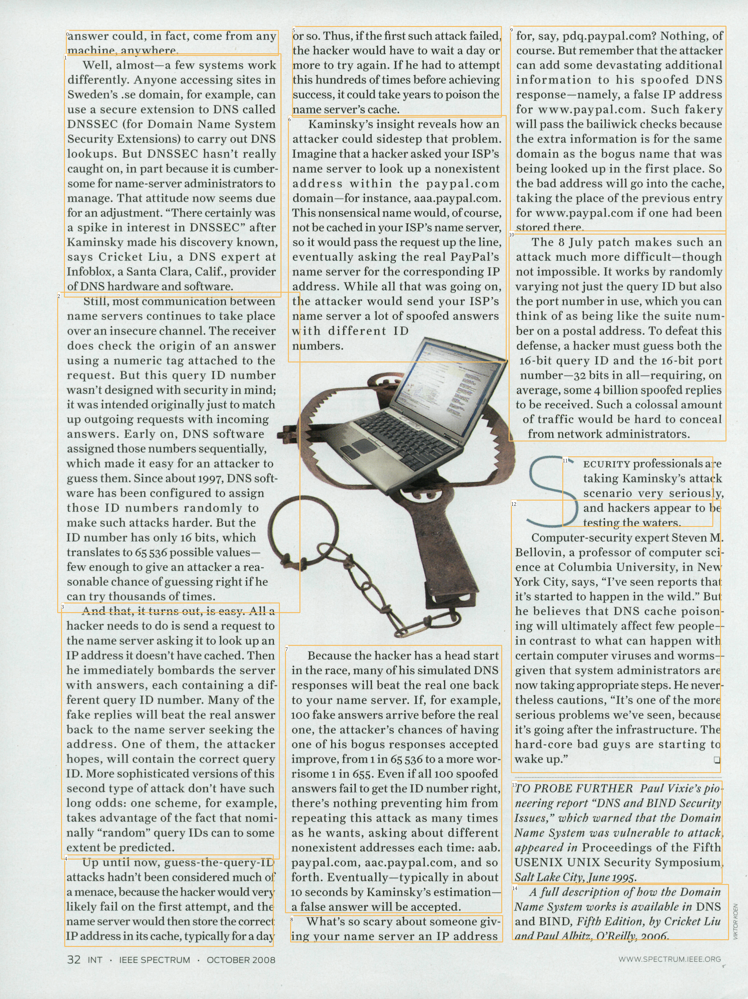

In [166]:
lp.draw_box(im, text_blocks,
            box_width=3, 
            show_element_id=True)

In [17]:
ocr_agent = lp.TesseractAgent(languages='eng') 

In [167]:
for block in unions(text_blocks):
    segment_image = (block.pad(left=10, right=10, top=10, bottom=10).crop_image(arr_im))
        # add padding in each image segment can help
        # improve robustness 
        
    text = ocr_agent.detect(segment_image)
    block.set(text=text, inplace=True)


for txt in text_blocks.get_texts():
    print(txt, end='\n---\n')

answer could, in fact, come from any
machine, anywhere.

---
SAL Liilic, airy YVLICIC.

Well, almost—a few systems work
differently. Anyone accessing sites in
Sweden’s .se domain, for example, can
use a secure extension to DNS called
DNSSEC (for Domain Name System
Security Extensions) to carry out DNS
lookups. But DNSSEC hasn’t really
caught on, in part because it is cumber-
some for name-server administrators to
manage. That attitude now seems due
for an adjustment. “There certainly was
a spike in interest in DNSSEC” after
Kaminsky made his discovery known,
says Cricket Liu, a DNS expert at
Infoblox, a Santa Clara, Calif., provider
of DNS hardware and software.

Se 2 OEE me a a i eS A aly ok Be

---
Still, most communication between _ th
name servers continues to take place _né
over aninsecure channel. The receiver w
does check the origin of an answer m
using a numeric tag attached to the
request. But this query ID number
wasn’t designed with security in mind;
it was intended origin